In [1]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

os.chdir('../')
from settings.config import Config
from src.dataset import AirbusDataset
from src.model import ResNetUnet, Unet
from src.metrics import dice_coeff, BCE_Dice_loss, f2_score, vis_logs

import warnings
warnings.filterwarnings('ignore')

2023-06-14 14:00:36.063299: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
dataset = AirbusDataset()
train_ds, valid_ds = dataset.get_datasets(segmentation=True)

model = ResNetUnet().build_model()
logs = {
    'loss': [],
    'val_loss': [],
    'dice_coeff': [],
    'val_dice_coeff': [],
    'f2_score': [],
    'val_f2_score': [],
    'lr': []
}

policy = tf.keras.mixed_precision.Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089
INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce GTX 1660 Ti, compute capability 7.5


12


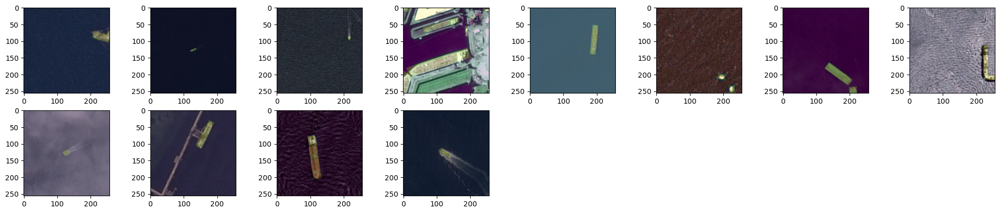

In [3]:
for batch in train_ds:
    print(len(batch[0]))
    plt.figure(figsize=(25,10))
    for i in range(len(batch[0])):
        ax = plt.subplot(4, 8, i + 1)
        ax.imshow(batch[0][i])
        ax.imshow(batch[1][i], alpha=0.2)
    plt.show()
    break

In [4]:
# Lion optimizer
# SGD + momentum
# single BCE or dice loss #loss="binary_crossentropy",
# choose lr
# Learning rate warmup.
# cosine with warmup

model = ResNetUnet().build_model()
model.load_weights(os.path.join(Config.model_path, 'unet.h5'))

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=Config.learning_rate),
                  loss=BCE_Dice_loss,
                  metrics=[f2_score, dice_coeff])

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    os.path.join(Config.model_path, 'unet.h5'),
    monitor='val_dice_coeff',
    save_best_only=True,
    save_weights_only=True,
    mode='max',
    initial_value_threshold=0.8
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_dice_coeff',
    factor=0.7,
    patience=3,
    mode='max',
    min_lr=1e-6
)

In [9]:
history = model.fit(train_ds, epochs=10, validation_data=valid_ds,
                    callbacks=[checkpoint, lr_scheduler])
logs = {k: logs[k] + history.history[k] for k in logs}

Epoch 1/10
549/549 [==============================] - 436s 703ms/step - loss: 0.6377 - f2_score: 0.5216 - dice_coeff: 0.5095 - val_loss: 0.7088 - val_f2_score: 0.4194 - val_dice_coeff: 0.2892 - lr: 0.0020
Epoch 2/10
549/549 [==============================] - 324s 555ms/step - loss: 0.5996 - f2_score: 0.6204 - dice_coeff: 0.6169 - val_loss: 0.7154 - val_f2_score: 0.4194 - val_dice_coeff: 0.2781 - lr: 0.0020
Epoch 3/10
549/549 [==============================] - 322s 553ms/step - loss: 0.5912 - f2_score: 0.6470 - dice_coeff: 0.6427 - val_loss: 0.6690 - val_f2_score: 0.4944 - val_dice_coeff: 0.4018 - lr: 0.0020
Epoch 4/10
549/549 [==============================] - 327s 562ms/step - loss: 0.5840 - f2_score: 0.6629 - dice_coeff: 0.6635 - val_loss: 0.6555 - val_f2_score: 0.5654 - val_dice_coeff: 0.4469 - lr: 0.0020
Epoch 5/10
549/549 [==============================] - 302s 517ms/step - loss: 0.5793 - f2_score: 0.6750 - dice_coeff: 0.6768 - val_loss: 0.6298 - val_f2_score: 0.5847 - val_dice_co

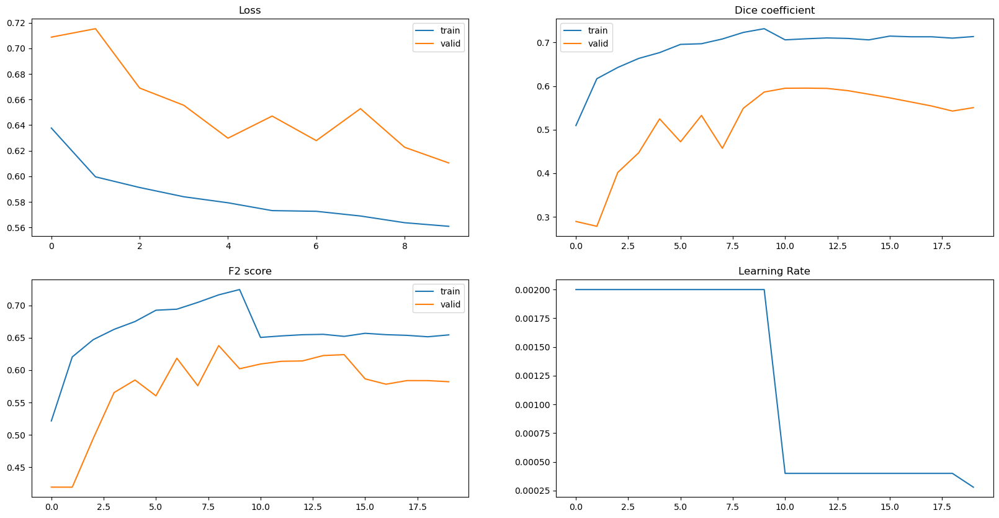

In [8]:
vis_logs(logs)

Since the training takes a lot of time and resources, I switched to the Kaggle kernel, and after experimenting with the architecture, to overcome the obvious overfit, I added dropouts in the last 3 convolutional layers of the encoder after the activation function, which, as we can see, gave a very positive effect and managed to increase dice by 10 percent. If you continue the current training, it is quite possible to get even better results.

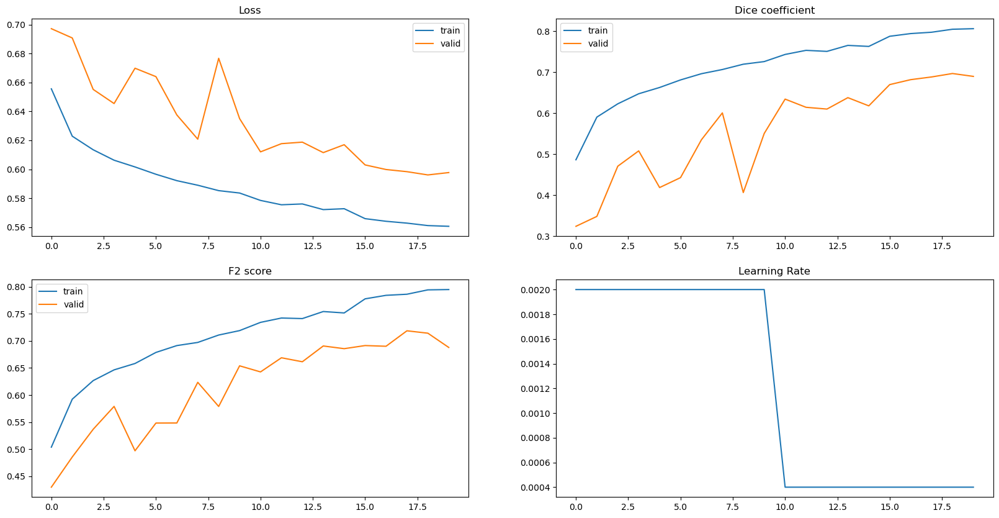

In [13]:
vis_logs(logs)

unet_dice83.h5 

0.5 # 0.6825

0.6 # 0.6843

0.7 # 0.6855

0.8 # 0.6870

0.9 # 0.6891

0.95 # 0.6910


In [15]:
best_model = ResNetUnet().build_model()
best_model.load_weights(os.path.join(Config.model_path, 'unet_dice83.h5'))

In [24]:
dices = []
for batch in valid_ds:
    pred = best_model(batch[0])
    pred = tf.cast(pred >= 0.95, tf.float32)
    pred = tf.round(pred)
    dice = dice_coeff(batch[1], tf.cast(pred, tf.float32))
    dices.append(dice)

In [25]:
np.mean(dices)

0.6910287

We observe that the model predominantly makes false positive errors, detecting coastlines, ports, or even certain buildings as ships. The most significant source of errors comes from docks. However, when it comes to ships in open sea, the model performs remarkably well, even on small vessels. This indicates that our approach with image cropping did not compromise the detection quality. Additionally, heavily damaged images where one channel dominates (e.g., yellow or blue) result in significant errors, as the model mistakenly identifies the entire color-dominant area as a ship. Although peculiar, this issue can be addressed through additional image preprocessing and the removal of such damages.

Therefore, the most influential errors are related to coastlines, ports, and cities. Firstly, there are few photographs of this kind, so one solution would be to gather more images with similar features and apply more augmentation techniques to them. It is worth considering image preprocessing methods that can better highlight areas with coastlines and ports. Perhaps using a deeper architecture capable of distinguishing between ships and ports would be beneficial.

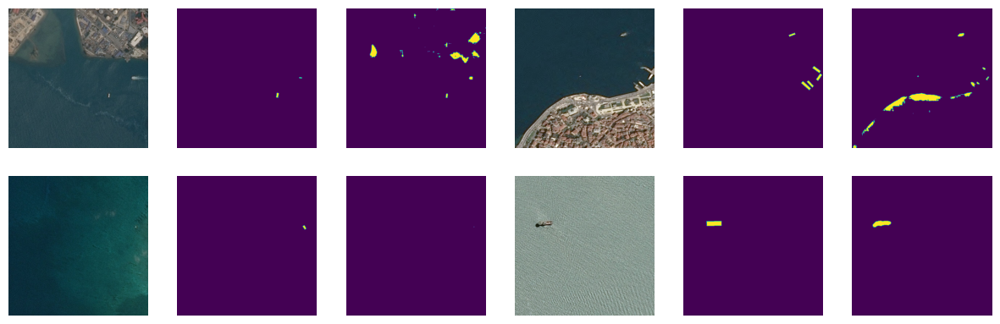

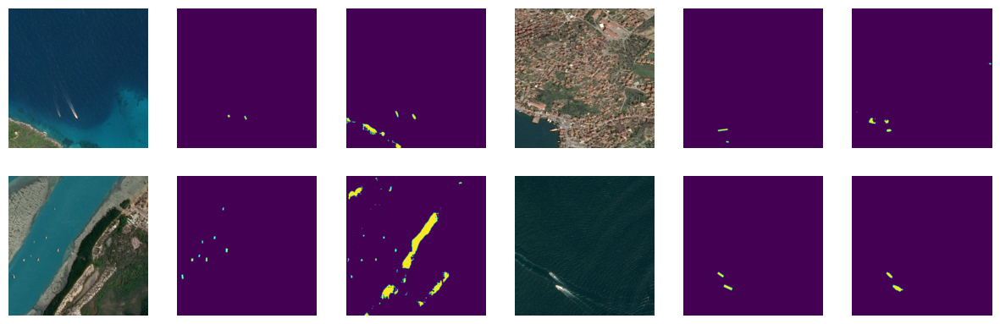

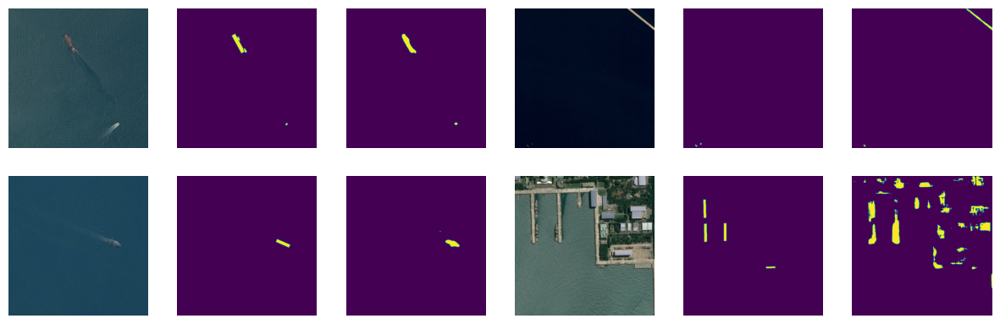

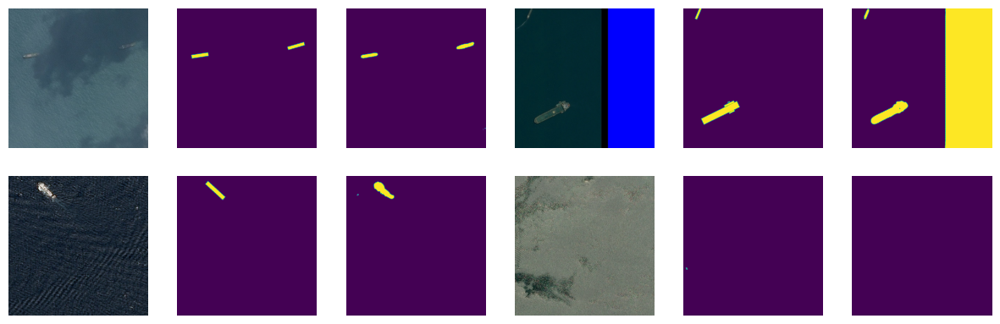

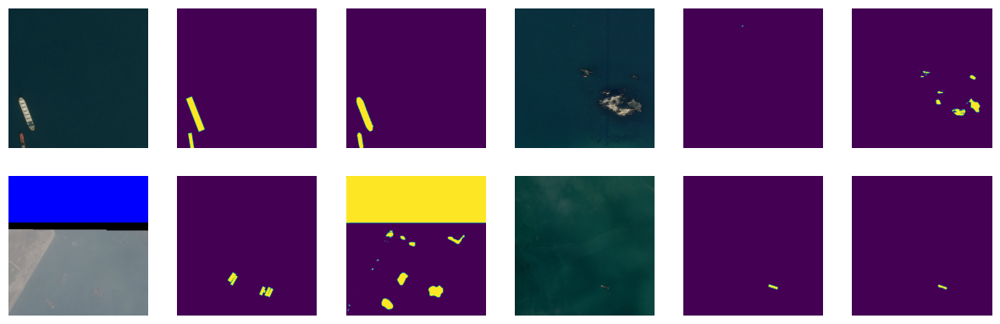

...

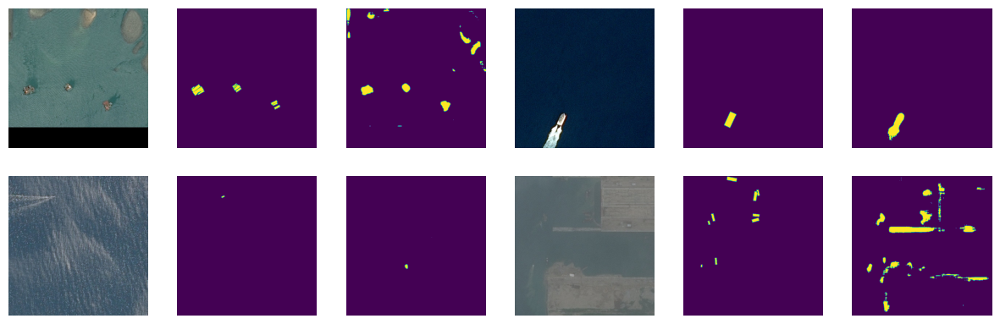

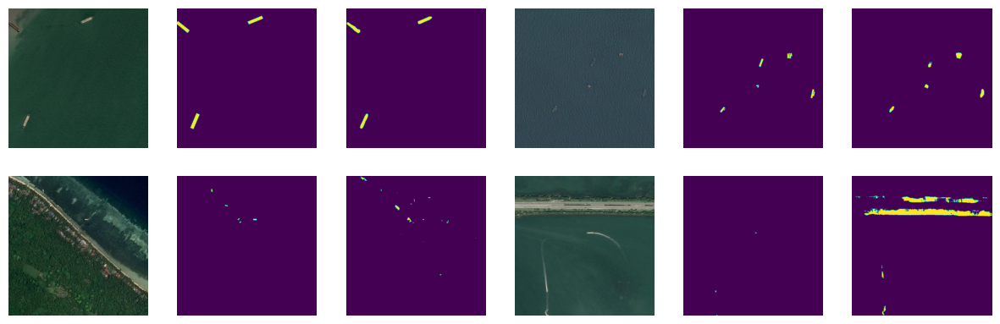

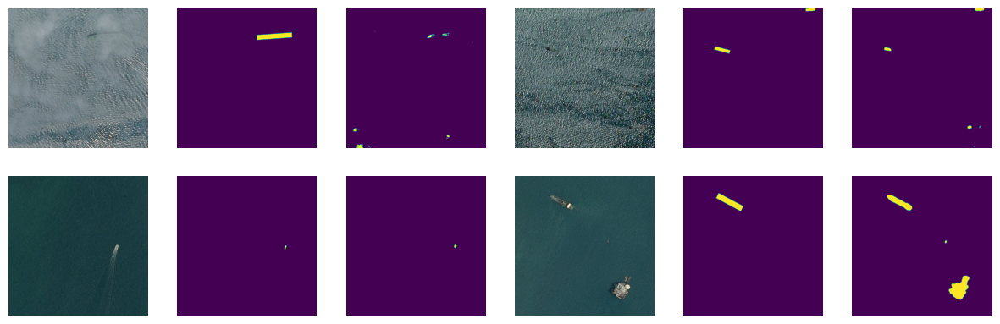

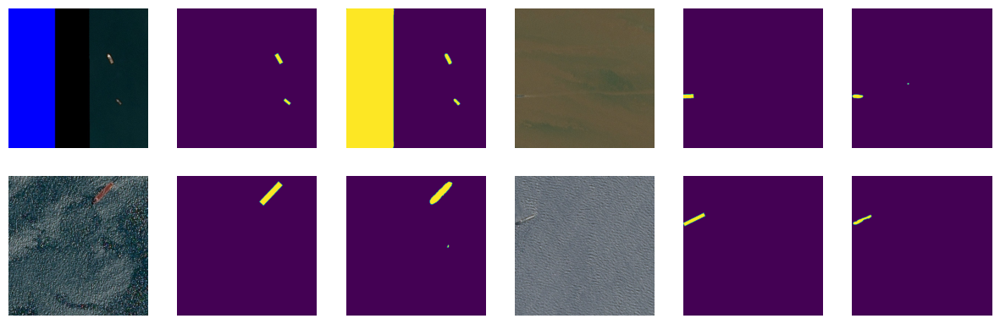

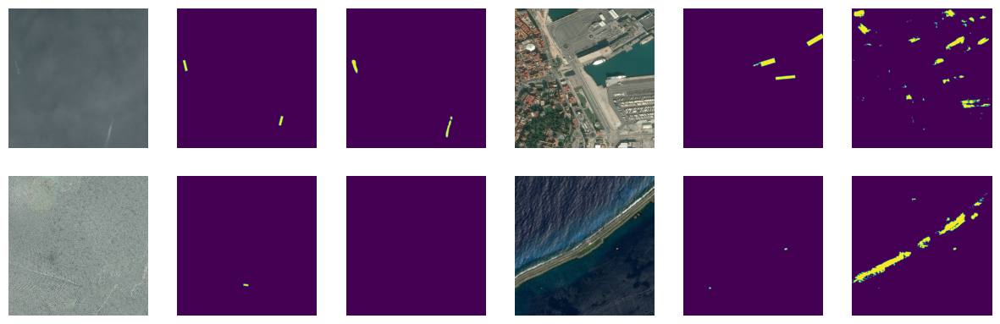

In [26]:
for i, batch in enumerate(valid_ds):
    pred = best_model(batch[0])
    pred = tf.cast(pred >= 0.95, tf.float32)
    pred = tf.round(pred)
    dice = dice_coeff(batch[1], tf.cast(pred, tf.float32))
    if dice < 0.45:
        plt.figure(figsize=(15, 15))
        for i in range(len(batch[0])):
            ax = plt.subplot(6, 6, i*3 + 1)
            ax.imshow(batch[0][i])
            ax.axis('off')
            ax = plt.subplot(6, 6, i*3 + 2)
            ax.imshow(batch[1][i])
            ax.axis('off')
            ax = plt.subplot(6, 6, i*3 + 3)
            pred = best_model(batch[0][i].numpy()[np.newaxis,:,:,:])[0,:,:,0].numpy()
            pred = np.round(pred)
            ax.imshow(pred)
            ax.axis('off')